In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse 
import itertools

import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
from sklearn import metrics

from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu


/home/qlyu/mambaforge/envs/bbbroutine/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
outdir     = "/scr/qlyu/projects/v1/results"
outdir_fig = "/scr/qlyu/projects/v1/figures"

In [3]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
adata_raw = adata_raw[adata_raw.obs['cond']=='P28NR']
counts = adata_raw.X
allgenes = adata_raw.var.index.values
adata_raw

View of AnnData object with n_obs × n_vars = 11061 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond'

In [4]:
efns = np.sort([i for i in allgenes if i.startswith('Efna') or i.startswith('Efnb')])
ephs = np.sort([i for i in allgenes if i.startswith('Epha') or i.startswith('Ephb')])
ephs = np.delete(ephs, np.where(ephs=='Epha2')) # not expressed in > 10 cells

print(len(efns), efns)
print(len(ephs), ephs)

8 ['Efna1' 'Efna2' 'Efna3' 'Efna4' 'Efna5' 'Efnb1' 'Efnb2' 'Efnb3']
13 ['Epha1' 'Epha10' 'Epha3' 'Epha4' 'Epha5' 'Epha6' 'Epha7' 'Epha8' 'Ephb1'
 'Ephb2' 'Ephb3' 'Ephb4' 'Ephb6']


In [5]:
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)

/tmp/ipykernel_3018795/2186893235.py:26: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)


In [6]:
# use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/candidate_genes_vincent_0503_v2.csv")
df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
genes_l23 = df['gene'].values
# genes_sel = adata_raw.var.index.values
# genes_grp = df['P17on'].astype(str).values
# assert len(genes_sel) == len(np.unique(genes_sel))

# Use P28 ordering
f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
gpt = pd.read_csv(f)
gpt = gpt['gene_ptime'].values
gptidx = np.argsort(gpt)

In [7]:
# filter genes
cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,cond]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [8]:
# select HVGs with mean and var
nbin = 20
qth = 0.3

# mean
gm = np.ravel(xn.mean(axis=0))

# var
tmp = xn.copy()
tmp.data = np.power(tmp.data, 2)
gv = np.ravel(tmp.mean(axis=0))-gm**2

# cut 
lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))
gres = pd.DataFrame()
gres['name'] = genes
gres['lbl'] = lbl
gres['mean'] = gm
gres['var'] = gv
gres['ratio']= gv/gm

# select
gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)
assert np.all(gsel_idx != -1)

In [9]:
l23_gidx = basicu.get_index_from_array(genes, genes_l23)
assert np.all(l23_gidx != -1)

In [10]:
efns_gidx = basicu.get_index_from_array(genes, efns)
ephs_gidx = basicu.get_index_from_array(genes, ephs)
epha5_gidx = basicu.get_index_from_array(genes, ['Epha5'])
assert np.all(efns_gidx != -1)
assert np.all(ephs_gidx != -1)

# efns[efns_gidx==-1], ephs[ephs_gidx==-1]

/tmp/ipykernel_3018795/3604246170.py:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(gm[gsel_idx], (gv/gm)[gsel_idx], c='k', s=5, edgecolor='none', cmap='rocket_r', label=f'{len(gsel_idx):,} HVGs')


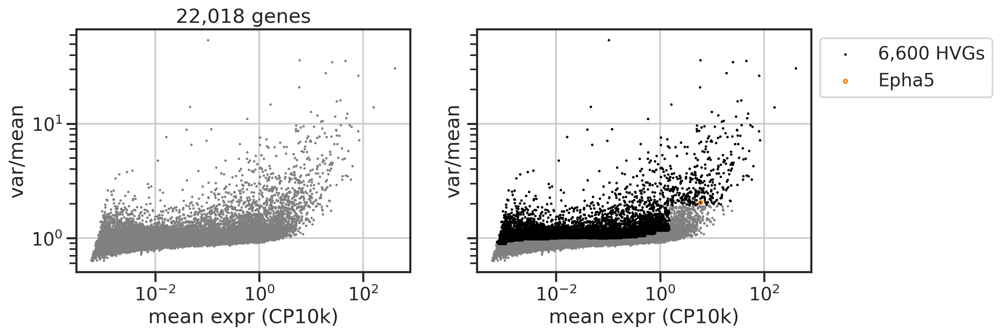

In [11]:
fig, axs = plt.subplots(1,2, figsize=(6*2,4), sharex=True, sharey=True)
ax = axs[0]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.set_title(f'{len(gm):,} genes')

ax = axs[1]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.scatter(gm[gsel_idx], (gv/gm)[gsel_idx], c='k', s=5, edgecolor='none', cmap='rocket_r', label=f'{len(gsel_idx):,} HVGs')
# ax.scatter(gm[l23_gidx], (gv/gm)[l23_gidx], s=5, facecolors='none', edgecolor='C0', label='L2/3 type genes')
# ax.scatter(gm[efns_gidx], (gv/gm)[efns_gidx], s=10, facecolors='none', edgecolor='C0', label='Ephrins')
# ax.scatter(gm[ephs_gidx], (gv/gm)[ephs_gidx], s=10, facecolors='none', edgecolor='C1', label='Ephs')
ax.scatter(gm[epha5_gidx], (gv/gm)[epha5_gidx], s=10, facecolors='none', edgecolor='C1', label='Epha5')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.legend(bbox_to_anchor=(1,1))

plt.show()

In [12]:
[genes[i] for i in l23_gidx if i not in gsel_idx], np.intersect1d(l23_gidx, gsel_idx).shape, l23_gidx.shape

(['Runx1t1',
  'Foxp1',
  'Focad',
  'Clcn2',
  'Elavl2',
  'Cntn2',
  'Cntnap1',
  'Sel1l3',
  'Osbpl3',
  'Igsf9b',
  'Mkx'],
 (275,),
 (286,))

In [13]:
adata = adata_sub[:,gsel_idx]
genes_sel = adata.var.index.values
lognorm = np.array(adata.layers['lognorm'].todense())
zlognorm = zscore(lognorm, axis=0)
adata

View of AnnData object with n_obs × n_vars = 11061 × 6600
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype'
    layers: 'norm', 'lognorm'

In [14]:
%%time
pca = PCA(n_components=50)
pcs = pca.fit_transform(zlognorm)
ucs = UMAP(n_components=2, n_neighbors=50).fit_transform(pcs)

# get results
res = pd.DataFrame(pcs, columns=np.char.add("PC", ((1+np.arange(pcs.shape[1])).astype(str))))
# res['cond'] = conds
res['type'] = types
res['samp'] = samps
res['umap1'] = ucs[:,0]
res['umap2'] = ucs[:,1]

CPU times: user 8min 47s, sys: 32.4 s, total: 9min 20s
Wall time: 30.2 s


Text(0, 0.5, 'explained var')

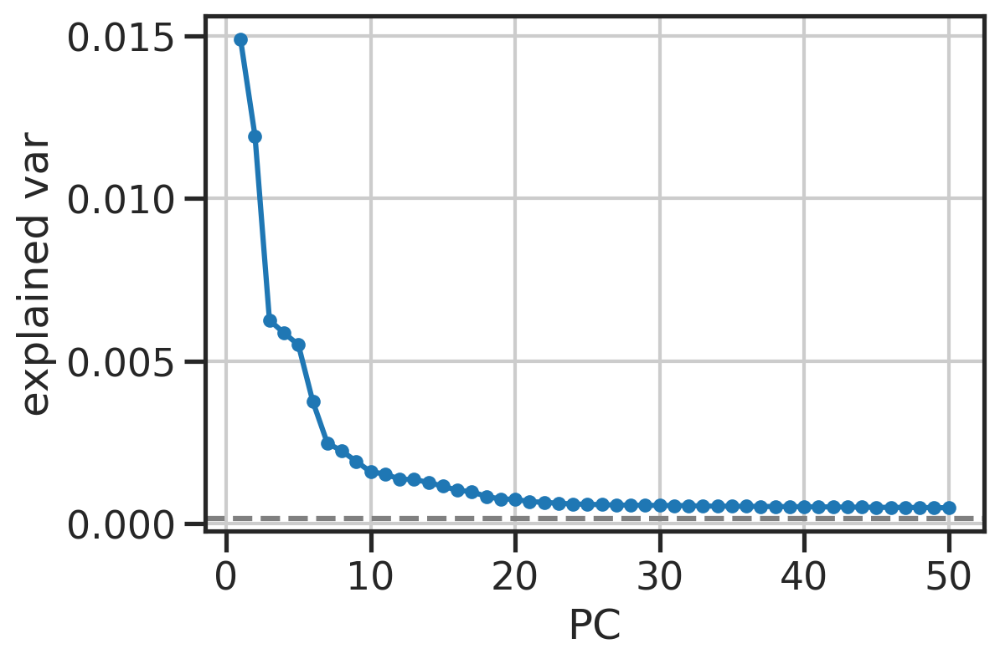

In [15]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(np.arange(len(pca.explained_variance_ratio_))+1, pca.explained_variance_ratio_, '-o', markersize=5)
ax.axhline(1/lognorm.shape[1], linestyle='--', color='gray')
ax.set_xlabel('PC')
ax.set_ylabel('explained var')

In [16]:
adata_ephefn = adata_sub[:,np.hstack([ephs, efns])]
adata_ephefn

View of AnnData object with n_obs × n_vars = 11061 × 21
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'easitype'
    layers: 'norm', 'lognorm'

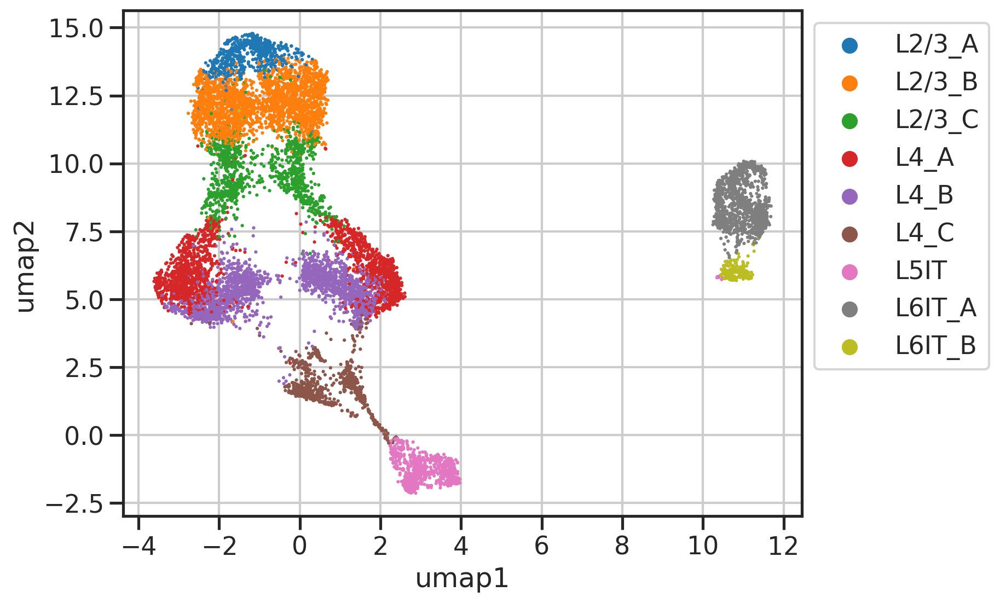

In [17]:

fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                # hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

# plot ephs and ephrins

In [18]:
# res
cols = adata_ephefn.var.index.values
print(len(cols), cols)

for i, col in enumerate(cols):
    a = adata_ephefn.layers['lognorm'][:,i]
    res[col] = np.ravel(a.todense())

21 ['Epha1' 'Epha10' 'Epha3' 'Epha4' 'Epha5' 'Epha6' 'Epha7' 'Epha8' 'Ephb1'
 'Ephb2' 'Ephb3' 'Ephb4' 'Ephb6' 'Efna1' 'Efna2' 'Efna3' 'Efna4' 'Efna5'
 'Efnb1' 'Efnb2' 'Efnb3']


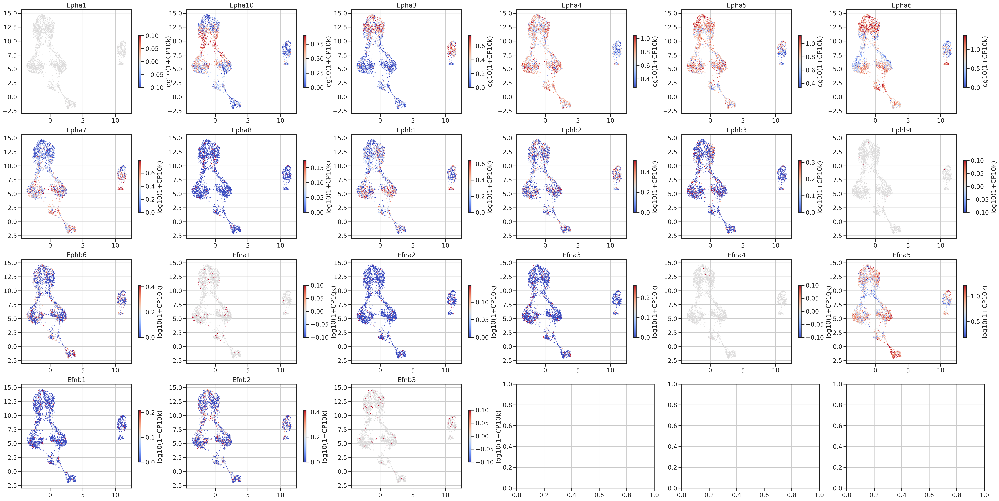

In [19]:
x = res['umap1'].values
y = res['umap2'].values

fig, axs = plt.subplots(4,6,figsize=(8*6,6*4))
for ax, col in zip(axs.flat, cols):
    c = res[col].values
    vmin = np.percentile(c, 5)
    vmax = np.percentile(c, 95)
    g = ax.scatter(x, y, c=c, cmap='coolwarm', s=1, edgecolor='none', vmin=vmin, vmax=vmax)
    fig.colorbar(g, shrink=0.5, label='log10(1+CP10k)')
    ax.set_title(col)
plt.show()

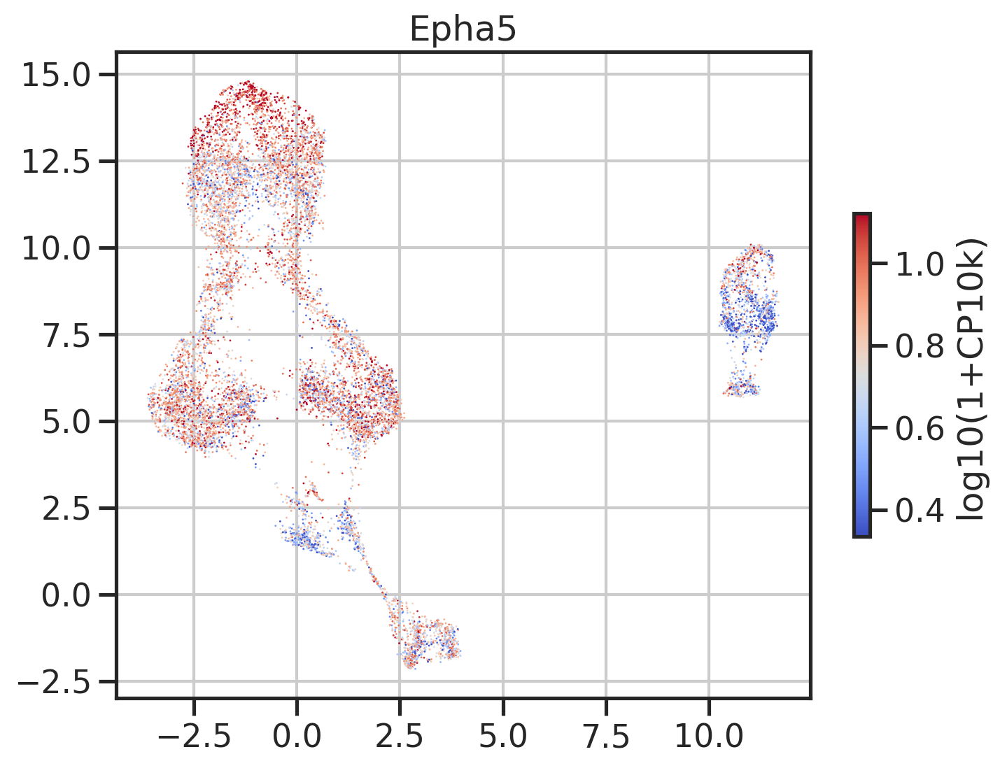

In [20]:
x = res['umap1'].values
y = res['umap2'].values
col = 'Epha5'

fig, ax = plt.subplots(figsize=(8,6))
c = res[col].values
vmin = np.percentile(c, 5)
vmax = np.percentile(c, 95)
g = ax.scatter(x, y, c=c, cmap='coolwarm', s=1, edgecolor='none', vmin=vmin, vmax=vmax)
fig.colorbar(g, shrink=0.5, label='log10(1+CP10k)')
ax.set_title(col)
plt.show()

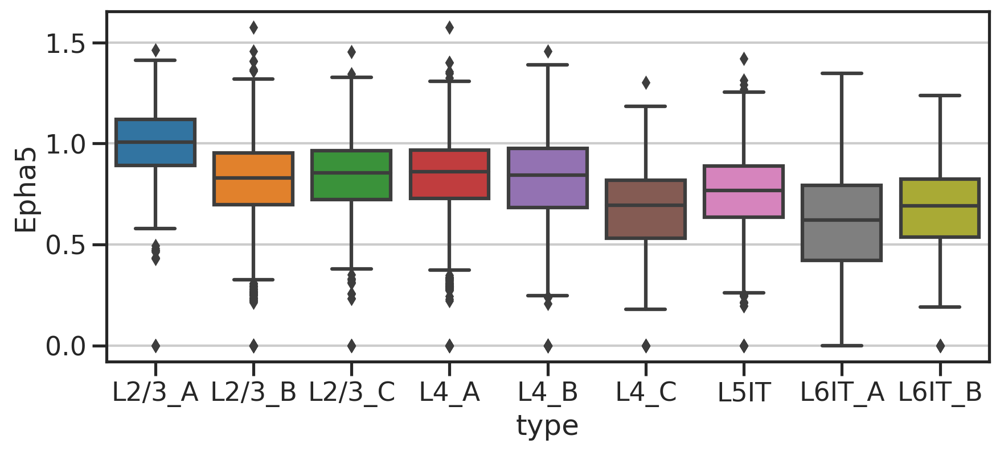

In [21]:
fig, ax = plt.subplots(figsize=(10,4))
sns.boxplot(data=res, x='type', y=col, ax=ax)
# sns.violinplot(data=res, x='type', y=col, ax=ax)
plt.show()

# variance explained by type vs others

In [27]:
adata_this = adata #[adata.obs['Type'].str.contains("L2/3")]
# xn = np.array(adata_this.layers['lognorm'].todense()) # cell by gene CP10k
xn = np.array(adata_this.layers['norm'].todense()) # cell by gene CP10k
lbls = adata_this.obs['Type'].values
xn.shape

(11061, 6600)

In [28]:
gm = np.mean(xn, axis=0)
unq, cnts = np.unique(lbls, return_counts=True) # .value_counts(sort=False)

In [29]:
tmp = pd.DataFrame(xn)
tmp['lbl'] = lbls 
glm = tmp.groupby('lbl', sort=True).mean().loc[unq]
glm

,0,1,2,3,4,5,6,7,8,9,...,6590,6591,6592,6593,6594,6595,6596,6597,6598,6599
lbl,,,,,,,,,,,,,,,,,,,,,
L2/3_A,7.570261,0.262628,0.002886,0.041520,1.171278,0.000000,0.007935,0.049882,0.002951,0.272124,...,1.210320,0.407982,0.056362,0.088069,1.322262,0.249331,1.556417,0.196541,5.197104,0.049184
L2/3_B,4.649147,0.161892,0.003696,0.036468,1.922984,0.000330,0.003496,0.023967,0.005955,0.233487,...,1.189039,0.405960,0.061137,0.097573,1.122449,0.204847,1.491141,0.217928,4.572117,0.070628
L2/3_C,4.310775,0.141094,0.003037,0.043243,2.552222,0.001144,0.001997,0.023081,0.004866,0.230134,...,1.370309,0.448821,0.054590,0.099270,1.397693,0.239754,1.811166,0.257861,3.991281,0.081183
L4_A,6.275499,0.184957,0.002983,0.044762,0.916080,0.000938,0.006953,0.019460,0.004679,0.172101,...,1.403337,0.544287,0.066004,0.098329,1.472480,0.256839,1.809115,0.224891,3.936404,0.088103
L4_B,7.333351,0.218995,0.004375,0.042740,0.648267,0.001451,0.004856,0.026918,0.007043,0.195646,...,1.326011,0.519619,0.062433,0.101259,1.418192,0.243866,1.737323,0.210721,5.073708,0.081824
L4_C,8.877561,0.263307,0.004240,0.038548,0.517255,0.001055,0.004986,0.032563,0.002906,0.232644,...,1.204734,0.405841,0.050822,0.078772,1.161231,0.195342,1.466735,0.191365,4.820587,0.078058
L5IT,8.917397,0.268007,0.003238,0.048844,0.582806,0.000000,0.004559,0.028350,0.002064,0.164920,...,0.956523,0.353785,0.043446,0.078543,0.856562,0.165957,1.237482,0.266630,5.279642,0.059429
L6IT_A,9.846029,0.342680,0.003742,0.041960,0.674479,0.013575,0.012756,0.020556,0.005858,0.212236,...,0.920133,0.377492,0.068409,0.103932,0.918809,0.181296,1.284428,0.285000,5.004134,0.067052
L6IT_B,7.005466,0.193398,0.002474,0.040195,1.131361,0.005563,0.002454,0.029785,0.010322,0.253843,...,0.958358,0.325910,0.052924,0.096062,0.908645,0.164636,1.204929,0.363465,5.510170,0.051076


In [30]:
sst = np.sum(np.power(xn - gm, 2), axis=0)
ssb = np.sum(np.power((glm.values - gm), 2)*cnts.reshape(-1,1), axis=0)
eta2 = ssb/sst

/tmp/ipykernel_3018795/3375036661.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(eta2)


<Axes: ylabel='Density'>

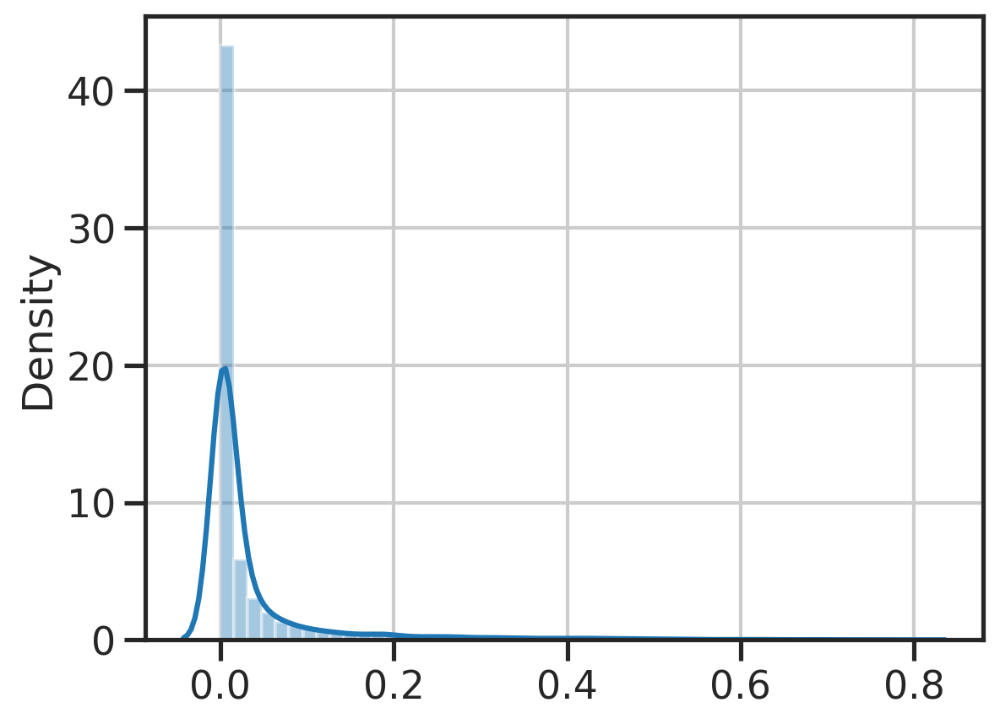

In [31]:
sns.distplot(eta2)

In [32]:
resg = pd.DataFrame(index=adata.var.index)
resg['eta2'] = eta2
resg.sort_values('eta2')

,eta2
Gm28071,0.000081
Gm6123,0.000085
4933400C23Rik,0.000090
AC093043.1,0.000095
AC139347.1,0.000116
...,...
Gria3,0.679317
Esrrg,0.681269
Galntl6,0.682150
Lrrtm4,0.731579


In [33]:
resg.loc[['Cux2', 'Rorb', 'Epha5', 'Epha6', 'Nr4a2']]

,eta2
Cux2,0.368240
Rorb,0.587885
Epha5,0.142494
Epha6,0.318574
Nr4a2,0.017540


In [ ]:
def get_eta2(mat, lbls):
    """
    mat: cell by gene
    lbls: cell type labels
    """
    nc, ng = mat.shape
    assert ng == len(lbls)
    
     
    
    return 

    
#     nums_m  = np.mean(nums, axis=(0,1)) # one for each gene (2) across time points and replicates (0,1)
#     nums_rm = np.mean(nums, axis=1) # one for each gene (2) and time-point (1) across replicates (1)
#     # print(nums_m.shape, nums_rm.shape)

#     # # SSt 
#     SSt = np.sum(np.power((nums - np.expand_dims(nums_m , axis=(0,1))), 2), axis=(0,1))  # one for each gene

#     # # SSw
#     SSw = np.sum(np.power((nums - np.expand_dims(nums_rm, axis=(1  ))), 2), axis=(0,1))  # one for each gene

#     eta2 = (1-(SSw+1e-6)/(SSt+1e-6))
#     stdb = np.sqrt((SSt-SSw)/(nt*nr))
#     return eta2, stdb

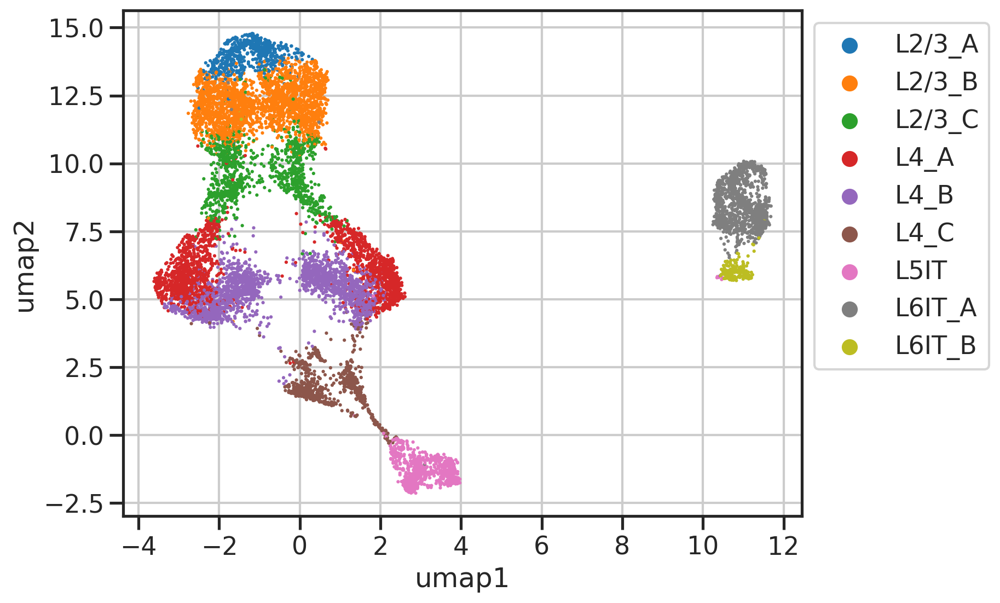

In [22]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                # hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

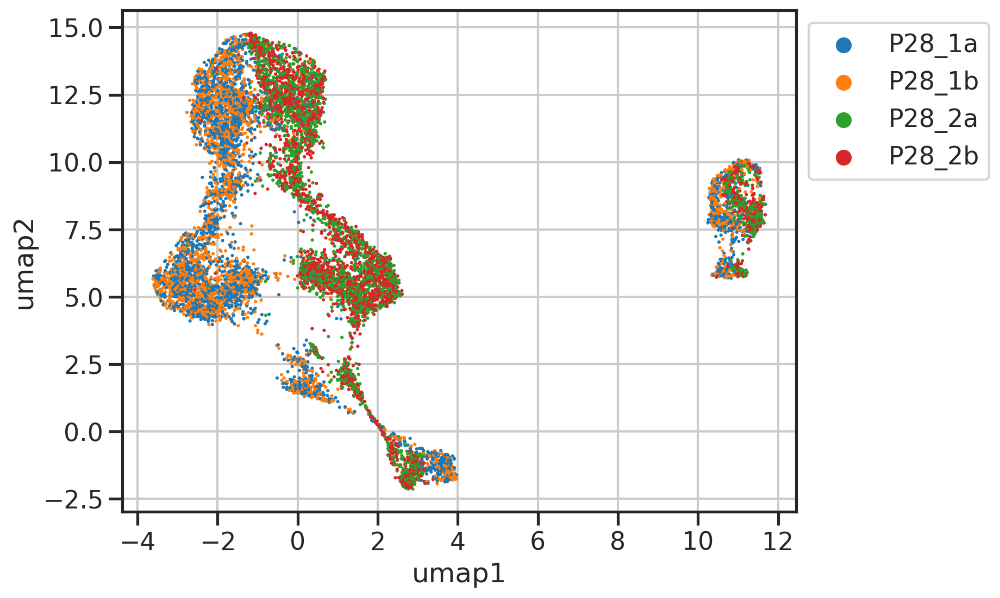

In [23]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                # hue='type',
                hue='samp',
                # hue_order=list(palette.keys()),
                # palette=palette,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

In [24]:
def plot_pcs(res, npc, hue):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]

        sns.scatterplot(data=res.sample(frac=1, replace=False), 
                        x=x, y=y, 
                        hue=hue,
                        # hue_order=list(palette.keys()),
                        # palette=palette,
                        s=5, edgecolor='none', 
                        legend=legend,
                        ax=ax,
                       )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

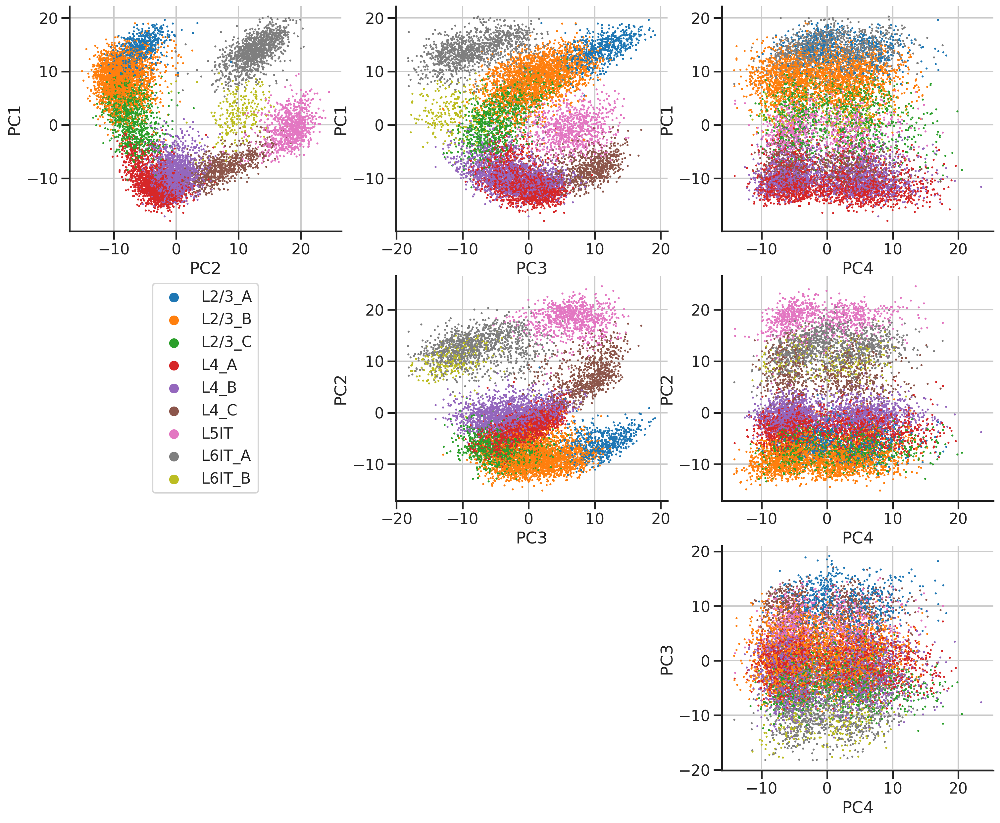

In [25]:
plot_pcs(res, 4, 'type')

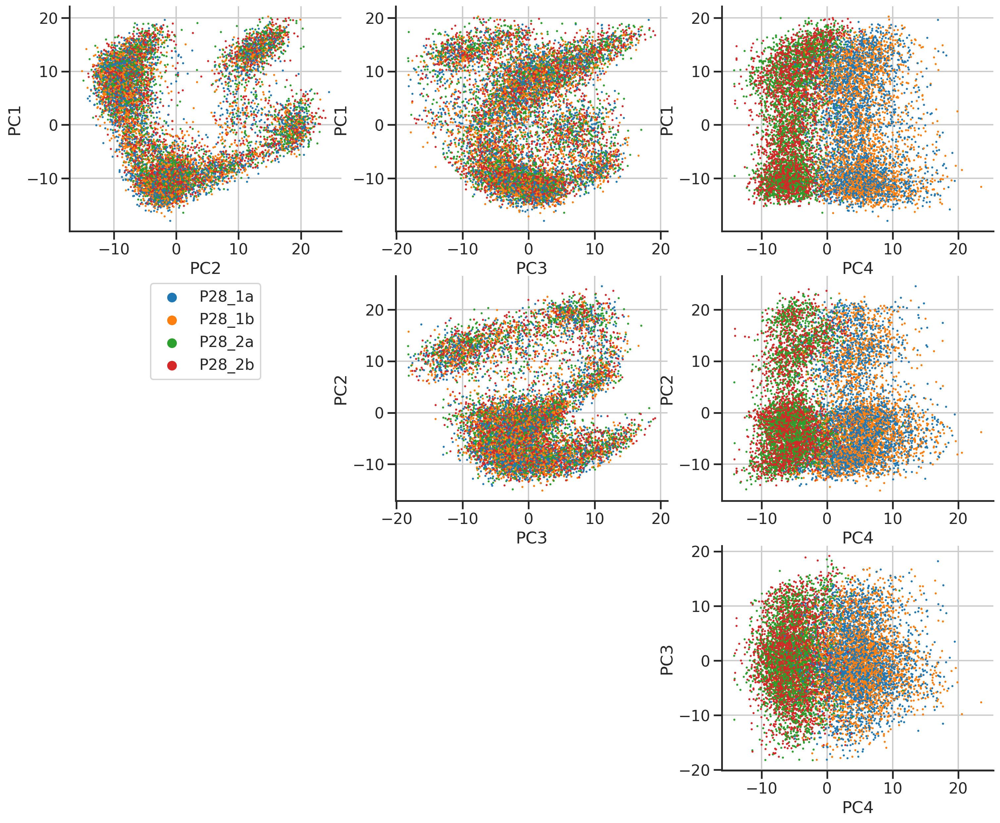

In [26]:
plot_pcs(res, 4, 'samp')